C:\Users\gusta\AppData\Local\Temp\ipykernel_1588\416201467.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


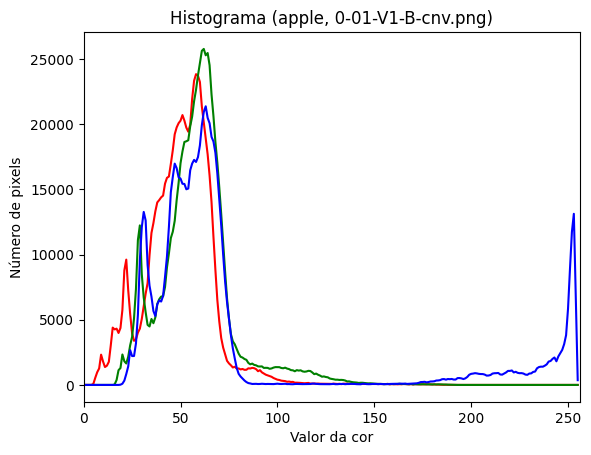

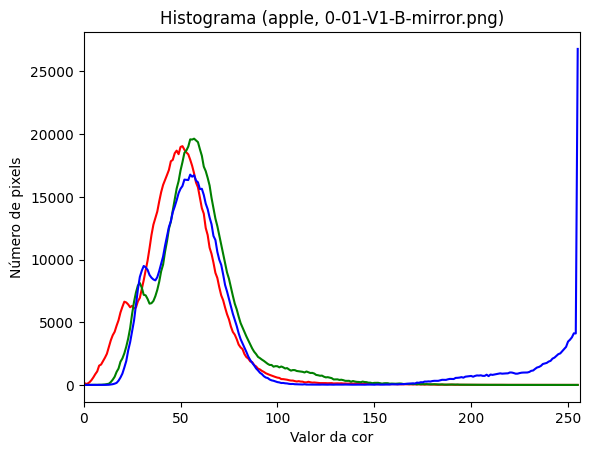

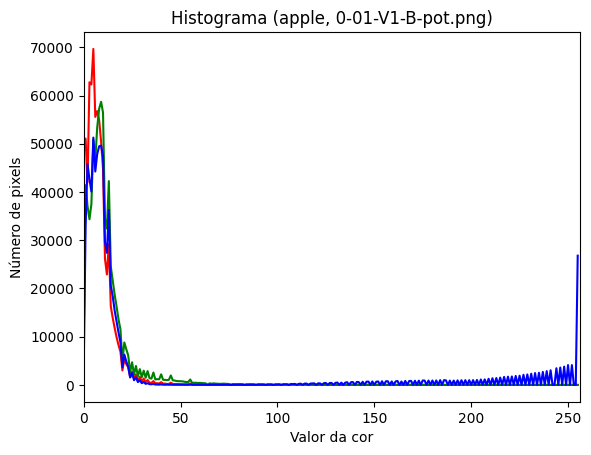

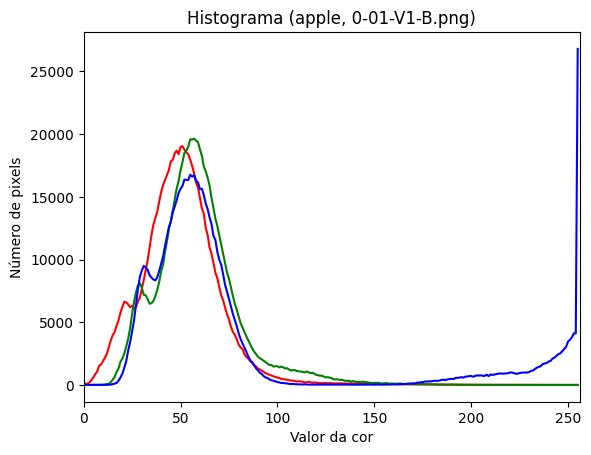

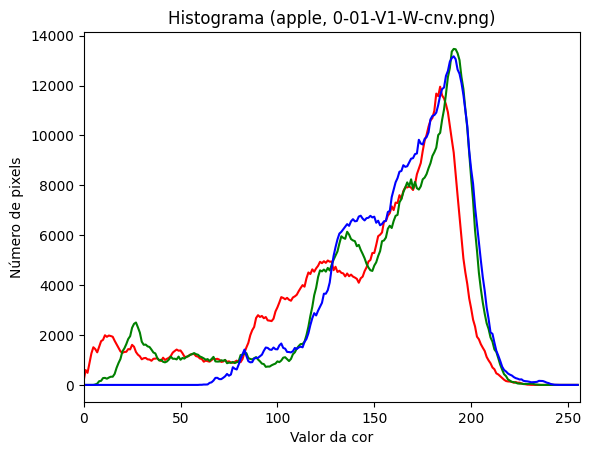

...

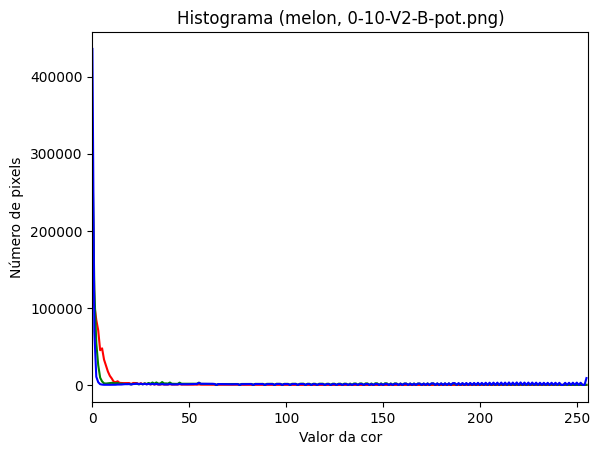

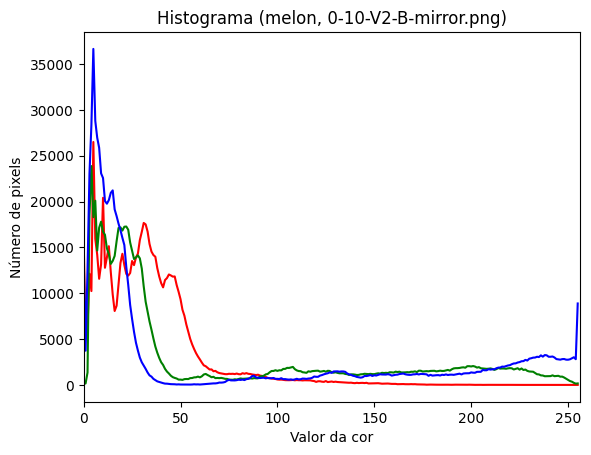

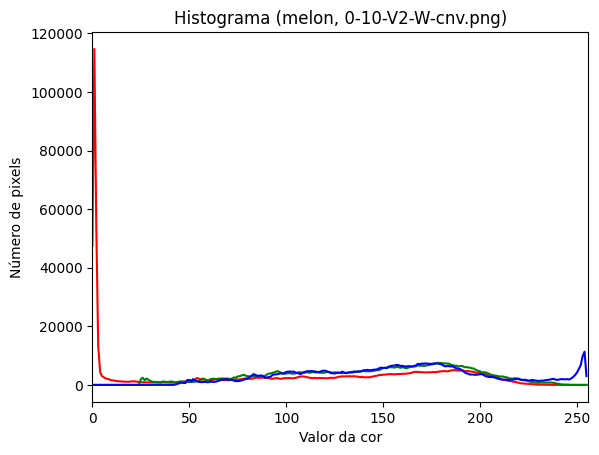

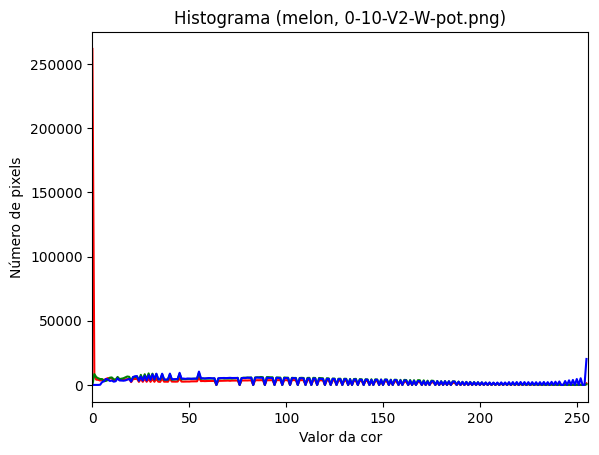

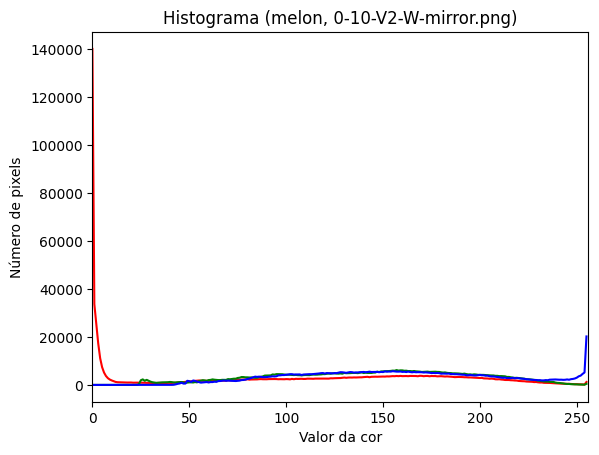

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def read_image(filename):
    return cv2.imread(filename)

def histogram_image(image, fruit, filename):
    # Gera e plota o histograma
    colors = ("red", "green", "blue")
    plt.figure()
    plt.xlim([0, 256])
    for channel_id, color in enumerate(colors):
        histogram, bin_edges = np.histogram(
            image[:, :, channel_id], bins=256, range=(0, 256)
        )
        plt.plot(bin_edges[0:-1], histogram, color=color)

    plt.title("Histograma ({}, {})".format(fruit, filename))
    plt.xlabel("Valor da cor")
    plt.ylabel("Número de pixels")

def process_image(image):
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image_blur = cv2.GaussianBlur(image_gray, (5, 5), 0)
    image_threshold = cv2.threshold(image_blur, 127, 255, cv2.THRESH_BINARY)[1]
    return image_threshold

fruits = [('apple', '01'), ('banana', '02'), ('pineapple', '03'), ('orange', '04'), ('pear', '05'), ('kiwi_fruit', '06'), ('avocado', '07'), ('dragon_fruit', '08'), ('lemon', '09'), ('melon', '10')]
versions = ['V1', 'V2']
colors = ['B', 'W']
operations = ['', 'cnv', 'pot', 'mirror']
folder_original_images = 'FrutasProcessadas'

def process_images_in_folder(folder_path, fruit):
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            filename = os.path.join(root, file)
            image = read_image(filename)
            histogram_image(image, fruit, file)

# Caminho para as imagens originais
for fruit in fruits:
    fruit_folder = os.path.join(folder_original_images, fruit[0].capitalize())
    process_images_in_folder(fruit_folder, fruit[0])

# Processar imagens com diferentes extensões
for fruit in fruits:
    for version in versions:
        for color in colors:
            for operation in operations:
                filename = f"0-{fruit[1]}-{version}-{color}-{operation}.png"
                image_path = os.path.join(folder_original_images, fruit[0].capitalize(), filename)
                if os.path.isfile(image_path):
                    image = read_image(image_path)
                    histogram_image(image, fruit[0], filename)
